In [2]:
import os
import math

import sklearn.metrics as metrics
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn

from numpy import load
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import f1_score
from sklearn import tree
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

from xgboost import XGBClassifier

from sklearn.impute import KNNImputer

from sklearn.svm import SVC

%matplotlib inline
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

rd_seed = 333

## Načtení dat

In [3]:
path_file = os.sep.join(['created_data', 'matrix_bak.csv'])
matrix_bak = pd.read_csv(path_file, sep=",")

## Info o datasetu

In [4]:
matrix_bak.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8043 entries, 0 to 8042
Data columns (total 33 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   studium_id              8043 non-null   int64  
 1   pohlavi_kod             8043 non-null   int64  
 2   je_cech                 8043 non-null   int64  
 3   datum_zahajeni          8043 non-null   int64  
 4   rok_maturity            8043 non-null   int64  
 5   maturita_nastup_rozdil  8043 non-null   int64  
 6   gymnazium               8043 non-null   int64  
 7   praha                   8043 non-null   int64  
 8   scio                    8043 non-null   int64  
 9   olym                    8043 non-null   int64  
 10  zkouska                 8043 non-null   int64  
 11  prominuti               8043 non-null   int64  
 12  dostudoval_uspesne      8043 non-null   int64  
 13  BI-PA1                  7870 non-null   float64
 14  BI-PAI                  7771 non-null   

In [3]:
matrix_bak.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8043 entries, 0 to 8042
Data columns (total 33 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   studium_id              8043 non-null   int64  
 1   pohlavi_kod             8043 non-null   int64  
 2   je_cech                 8043 non-null   int64  
 3   datum_zahajeni          8043 non-null   int64  
 4   rok_maturity            8043 non-null   int64  
 5   maturita_nastup_rozdil  8043 non-null   int64  
 6   gymnazium               8043 non-null   int64  
 7   praha                   8043 non-null   int64  
 8   scio                    8043 non-null   int64  
 9   olym                    8043 non-null   int64  
 10  zkouska                 8043 non-null   int64  
 11  prominuti               8043 non-null   int64  
 12  dostudoval_uspesne      8043 non-null   int64  
 13  BI-PA1                  7870 non-null   float64
 14  BI-PAI                  7771 non-null   

In [4]:
matrix_bak.mean()

studium_id                1.040487e+07
pohlavi_kod               1.123959e-01
je_cech                   8.044262e-01
datum_zahajeni            2.014520e+03
rok_maturity              2.013731e+03
maturita_nastup_rozdil    7.888847e-01
gymnazium                 5.159766e-01
praha                     9.561109e-02
scio                      5.856024e-02
olym                      5.197066e-02
zkouska                   1.765510e-02
prominuti                 1.380082e-02
dostudoval_uspesne        2.627129e-01
BI-PA1                    3.023698e+00
BI-PAI                    2.751448e+00
BI-CAO                    2.061652e+00
BI-PS1                    3.089703e+00
BI-MLO                    2.859733e+00
BI-ZMA                    3.122120e+00
BI-PA2                    2.933333e+00
BI-DBS                    2.441259e+00
BI-SAP                    2.359312e+00
BI-LIN                    3.184519e+00
BI-AG1                    2.839988e+00
BI-AAG                    2.673702e+00
BI-ZDM                   

## Příprava datasetu

### Nastavení indexu

In [5]:
matrix_bak = matrix_bak.set_index(['studium_id'])

### Přidání příznaků

In [6]:
matrix_bak['prumer'] = matrix_bak.loc[:, 'BI-PA1':'BI-EMP'].mean(axis=1)

In [7]:
matrix_bak.mean()

pohlavi_kod                  0.112396
je_cech                      0.804426
datum_zahajeni            2014.519955
rok_maturity              2013.731070
maturita_nastup_rozdil       0.788885
gymnazium                    0.515977
praha                        0.095611
scio                         0.058560
olym                         0.051971
zkouska                      0.017655
prominuti                    0.013801
dostudoval_uspesne           0.262713
BI-PA1                       3.023698
BI-PAI                       2.751448
BI-CAO                       2.061652
BI-PS1                       3.089703
BI-MLO                       2.859733
BI-ZMA                       3.122120
BI-PA2                       2.933333
BI-DBS                       2.441259
BI-SAP                       2.359312
BI-LIN                       3.184519
BI-AG1                       2.839988
BI-AAG                       2.673702
BI-ZDM                       2.786905
BI-OSY                       2.682884
BI-PSI      

### Doplnění NaN hodnot

##### Doplnění pomocí KNNImputer

In [8]:
imputer = KNNImputer(n_neighbors=5, weights='distance')
matrix_bak = pd.DataFrame(imputer.fit_transform(matrix_bak), index=matrix_bak.index, columns=matrix_bak.columns)

In [9]:
matrix_bak.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8043 entries, 1578106 to 1577906
Data columns (total 33 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   pohlavi_kod             8043 non-null   float64
 1   je_cech                 8043 non-null   float64
 2   datum_zahajeni          8043 non-null   float64
 3   rok_maturity            8043 non-null   float64
 4   maturita_nastup_rozdil  8043 non-null   float64
 5   gymnazium               8043 non-null   float64
 6   praha                   8043 non-null   float64
 7   scio                    8043 non-null   float64
 8   olym                    8043 non-null   float64
 9   zkouska                 8043 non-null   float64
 10  prominuti               8043 non-null   float64
 11  dostudoval_uspesne      8043 non-null   float64
 12  BI-PA1                  8043 non-null   float64
 13  BI-PAI                  8043 non-null   float64
 14  BI-CAO                  8043 no

#### Zaokrouhlení doplněných hodnot

In [10]:
grades = [1, 1.5, 2, 2.5, 3, 4]

In [11]:
def custom_round(value):
    return min(grades, key=lambda x:abs(x-value))

In [12]:
matrix_bak.loc[:, 'BI-PA1':'BI-EMP'] = matrix_bak.loc[:, 'BI-PA1':'BI-EMP'].applymap(custom_round)

In [13]:
matrix_bak

,pohlavi_kod,je_cech,datum_zahajeni,rok_maturity,maturita_nastup_rozdil,gymnazium,praha,scio,olym,zkouska,prominuti,dostudoval_uspesne,BI-PA1,BI-PAI,BI-CAO,BI-PS1,BI-MLO,BI-ZMA,BI-PA2,BI-DBS,BI-SAP,BI-LIN,BI-AG1,BI-AAG,BI-ZDM,BI-OSY,BI-PSI,BI-BEZ,BI-PST,BI-DPR,BI-SI1.2,BI-EMP,prumer
studium_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1578106,0.0,0.0,2009.0,2007.0,2.0,0.0,-1.0,0.0,0.0,0.0,0.0,1.0,2.0,1.5,1.5,2.0,2.0,2.0,3.0,2.0,1.5,1.0,3.0,2.0,3.0,1.5,2.0,3.0,1.5,1.5,2.5,3.0,2.026316
1584806,0.0,0.0,2009.0,2006.0,3.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,2.5,3.0,4.0,3.0,4.0,3.0,3.0,3.0,2.5,3.0,2.0,2.0,3.0,4.000000
19374606,0.0,1.0,2021.0,2009.0,12.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,4.0,2.5,4.0,4.0,3.0,3.0,3.0,2.5,4.0,4.0,3.0,3.0,3.0,2.5,2.0,2.5,2.0,2.0,2.0,2.5,4.000000
4783406,0.0,1.0,2011.0,2009.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,3.0,1.5,4.0,2.5,2.5,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.5,2.5,3.0,3.277778
8396706,1.0,1.0,2013.0,2009.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,3.0,3.0,2.5,3.0,4.0,2.5,4.000000
4047706,0.0,1.0,2010.0,2009.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,1.5,3.0,1.5,1.5,3.0,2.0,1.5,2.5,2.5,2.5,2.0,2.5,2.5,2.5,2.0,1.5,1.5,2.5,2.210526
4288906,0.0,1.0,2010.0,2010.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,4.0,1.5,2.5,1.5,1.0,4.0,4.0,4.0,4.0,3.0,4.0,3.0,4.0,4.0,4.0,4.0,2.0,3.0,3.0,3.050000
5497506,1.0,1.0,2011.0,2009.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.5,3.0,3.0,4.0,3.0,4.0,4.0,4.0,1.5,2.0,4.0,4.0,4.0,2.0,4.0,3.0,3.0,2.5,3.0,3.0,3.153846
9226106,0.0,1.0,2014.0,2009.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.5,1.5,1.0,2.5,2.0,1.5,4.0,2.5,4.0,2.0,3.0,3.0,3.0,2.5,2.5,4.0,4.0,1.0,2.0,4.0,2.552632


### Pomocné promenné

In [14]:
# predmety podle doporuceneho semestru
courses_1 = ['BI-PA1', 'BI-PAI', 'BI-CAO', 'BI-PS1', 'BI-MLO', 'BI-ZMA']
courses_2 = ['BI-PA2', 'BI-DBS', 'BI-SAP', 'BI-LIN']
courses_3 = ['BI-AAG', 'BI-ZDM', 'BI-AG1']
courses_4 = ['BI-OSY', 'BI-PSI', 'BI-BEZ']
courses_5 = ['BI-PST']
courses_6 = ['BI-DPR']
courses_7 = ['BI-SI1.2', 'BI-EMP']

courses = courses_1 + courses_2 + courses_3 + courses_4 + courses_5 + courses_6 + courses_7

In [15]:
means = {'BI-PA1':3, 'BI-PAI':3, 'BI-CAO':2, 'BI-PS1':3, 'BI-MLO':3, 'BI-ZMA':3,
        'BI-PA2':3, 'BI-DBS':2.5, 'BI-SAP':2.5, 'BI-LIN':3,
        'BI-AAG':3, 'BI-ZDM':3, 'BI-AG1':3,
        'BI-OSY':2.5, 'BI-PSI':2.5, 'BI-BEZ':2.5,
        'BI-PST':2,
        'BI-DPR':1.5,
        'BI-SI1.2':2, 'BI-EMP':2
        }

prumer_mean = 3

### Nastavení příznaků na kategorické - ordinální

In [16]:
# ordinální
grades_category = pd.api.types.CategoricalDtype(categories=[1, 1.5, 2, 2.5, 3, 4, 0], ordered=True)
# BI-PA1
matrix_bak['BI-PA1'] = matrix_bak['BI-PA1'].astype(grades_category)
# BI-PAI
matrix_bak['BI-PAI'] = matrix_bak['BI-PAI'].astype(grades_category)
# BI-CAO
matrix_bak['BI-CAO'] = matrix_bak['BI-CAO'].astype(grades_category)
# BI-PS1
matrix_bak['BI-PS1'] = matrix_bak['BI-PS1'].astype(grades_category)
# BI-MLO
matrix_bak['BI-MLO'] = matrix_bak['BI-MLO'].astype(grades_category)
# BI-ZMA
matrix_bak['BI-ZMA'] = matrix_bak['BI-ZMA'].astype(grades_category)
# BI-PA2
matrix_bak['BI-PA2'] = matrix_bak['BI-PA2'].astype(grades_category)
# BI-DBS
matrix_bak['BI-DBS'] = matrix_bak['BI-DBS'].astype(grades_category)
# BI-SAP
matrix_bak['BI-SAP'] = matrix_bak['BI-SAP'].astype(grades_category)
# BI-LIN
matrix_bak['BI-LIN'] = matrix_bak['BI-LIN'].astype(grades_category)
# BI-AG1
matrix_bak['BI-AG1'] = matrix_bak['BI-AG1'].astype(grades_category)
# BI-AAG
matrix_bak['BI-AAG'] = matrix_bak['BI-AAG'].astype(grades_category)
# BI-ZDM
matrix_bak['BI-ZDM'] = matrix_bak['BI-ZDM'].astype(grades_category)
# BI-OSY
matrix_bak['BI-OSY'] = matrix_bak['BI-OSY'].astype(grades_category)
# BI-PSI
matrix_bak['BI-PSI'] = matrix_bak['BI-PSI'].astype(grades_category)
# BI-BEZ
matrix_bak['BI-BEZ'] = matrix_bak['BI-BEZ'].astype(grades_category)
# BI-PST
matrix_bak['BI-PST'] = matrix_bak['BI-PST'].astype(grades_category)
# BI-SI1.2
matrix_bak['BI-SI1.2'] = matrix_bak['BI-SI1.2'].astype(grades_category)
# BI-MLO
matrix_bak['BI-EMP'] = matrix_bak['BI-EMP'].astype(grades_category)
# BI-DPR
matrix_bak['BI-DPR'] = matrix_bak['BI-DPR'].astype(grades_category)

### Nastavení nepředmětových atributů na kategorické

In [17]:
# ordinální
attr_category = pd.api.types.CategoricalDtype(categories=[0, 1], ordered=False)
# pohlavi_kod
matrix_bak['pohlavi_kod'] = matrix_bak['pohlavi_kod'].astype(attr_category)
# scio
matrix_bak['scio'] = matrix_bak['scio'].astype(attr_category)
# olym
matrix_bak['olym'] = matrix_bak['olym'].astype(attr_category)
# zkouska
matrix_bak['zkouska'] = matrix_bak['zkouska'].astype(attr_category)
# prominuti
matrix_bak['prominuti'] = matrix_bak['prominuti'].astype(attr_category)

In [18]:
# ordinální
attr_category = pd.api.types.CategoricalDtype(categories=[-1, 0, 1], ordered=False)
# je_cech
matrix_bak['je_cech'] = matrix_bak['je_cech'].astype(attr_category)
# gymnazium
matrix_bak['gymnazium'] = matrix_bak['gymnazium'].astype(attr_category)
# praha
matrix_bak['praha'] = matrix_bak['praha'].astype(attr_category)

In [19]:
matrix_bak.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8043 entries, 1578106 to 1577906
Data columns (total 33 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   pohlavi_kod             8043 non-null   category
 1   je_cech                 8043 non-null   category
 2   datum_zahajeni          8043 non-null   float64 
 3   rok_maturity            8043 non-null   float64 
 4   maturita_nastup_rozdil  8043 non-null   float64 
 5   gymnazium               8043 non-null   category
 6   praha                   8043 non-null   category
 7   scio                    8043 non-null   category
 8   olym                    8043 non-null   category
 9   zkouska                 8043 non-null   category
 10  prominuti               8043 non-null   category
 11  dostudoval_uspesne      8043 non-null   float64 
 12  BI-PA1                  8043 non-null   category
 13  BI-PAI                  8043 non-null   category
 14  BI-CAO         

## Modelování

### Bakalář všechny pp

#### Rozdělení datasetu

In [20]:
Xdata = matrix_bak.drop(columns='dostudoval_uspesne')
ydata = matrix_bak.dostudoval_uspesne

In [21]:
Xtrain, Xtest, ytrain, ytest = train_test_split(Xdata, ydata, test_size=0.2, random_state=rd_seed, stratify=ydata, shuffle=True) 
print("původní data")
display(Xdata.shape)
display(ydata.shape)
print("trénovací data")
display(Xtrain.shape)
display(ytrain.shape)
print("testovací data")
display(Xtest.shape)
display(ytest.shape)

původní data


(8043, 32)

(8043,)

trénovací data


(6434, 32)

(6434,)

testovací data


(1609, 32)

(1609,)

#### Funkce pro vybrání vhodných hyperparametrů pomocí křížové validace

In [22]:
def get_best_parameters(param_grid, classifier, xgb=None):
    score = 'f1'
    if xgb:
        model = GridSearchCV(classifier(eval_metric='mlogloss', use_label_encoder=False, tree_method="gpu_hist", enable_categorical=True), param_grid, cv=5, scoring=score)
    else:
        model = GridSearchCV(classifier(), param_grid, cv=5, scoring=score)
    model.fit(Xtrain, ytrain)

    print('Best hyper-parameters are: ')
    print(model.best_params_)
    print()

    means = model.cv_results_["mean_test_score"]
    stds = model.cv_results_["std_test_score"]
    for mean, std, params in zip(means, stds, model.cv_results_["params"]):
        print("%0.6f (+/-%0.06f) for %r" % (mean, std * 2, params))
    print()
    return model

#### Rozhodovací strom

In [23]:
param_grid = [
    {'criterion':['gini','entropy'],
    'max_depth': range(2,7),
    'min_samples_leaf':[10]}
]

In [24]:
dt_f1 = get_best_parameters(param_grid, DecisionTreeClassifier)

Best hyper-parameters are: 
{'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 10}

0.909804 (+/-0.012065) for {'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 10}
0.914849 (+/-0.011277) for {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 10}
0.927726 (+/-0.007523) for {'criterion': 'gini', 'max_depth': 4, 'min_samples_leaf': 10}
0.942461 (+/-0.009334) for {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 10}
0.949169 (+/-0.014452) for {'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 10}
0.913935 (+/-0.012206) for {'criterion': 'entropy', 'max_depth': 2, 'min_samples_leaf': 10}
0.925454 (+/-0.009387) for {'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 10}
0.928897 (+/-0.011218) for {'criterion': 'entropy', 'max_depth': 4, 'min_samples_leaf': 10}
0.938442 (+/-0.015489) for {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 10}
0.943336 (+/-0.010591) for {'criterion': 'entropy', 'max_depth': 6, 'min_samples_leaf': 10}



In [25]:
print('accuracy score (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, dt_f1.predict(Xtrain))))
print('accuracy score (test): {0:.6f}'.format(metrics.accuracy_score(ytest, dt_f1.predict(Xtest))))

accuracy score (train): 0.976065
accuracy score (test): 0.967060


In [26]:
feature_importances=pd.DataFrame({'features':Xtrain.columns,'feature_importance':dt_f1.best_estimator_.feature_importances_})
feature_importances.sort_values('feature_importance',ascending=False)

,features,feature_importance
31,prumer,0.864080
20,BI-LIN,0.043796
22,BI-AAG,0.030065
24,BI-OSY,0.023438
28,BI-DPR,0.019462
2,datum_zahajeni,0.013580
18,BI-DBS,0.004657
19,BI-SAP,0.000503
13,BI-CAO,0.000359
23,BI-ZDM,0.000059


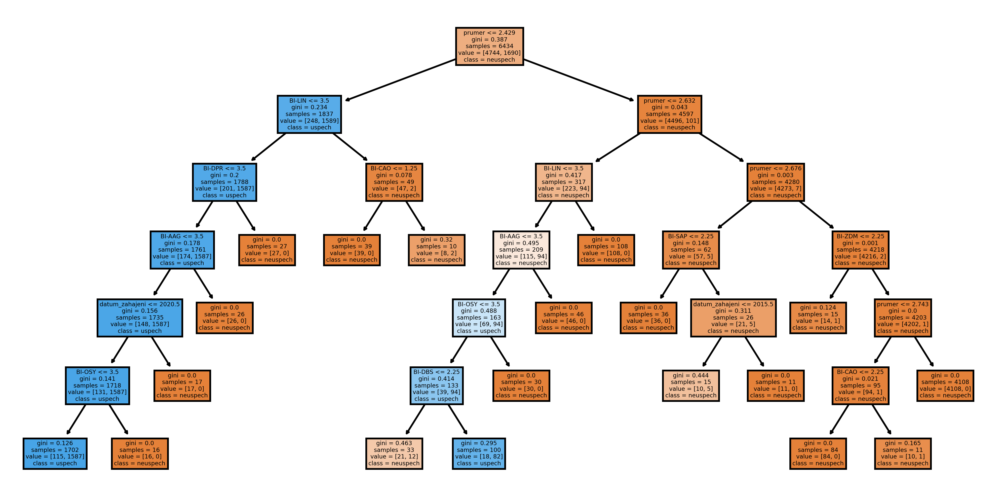

In [27]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10,5), dpi=500)
tree.plot_tree(dt_f1.best_estimator_,
               feature_names = Xdata.columns, 
               class_names=['neuspech', 'uspech'],
               filled = True);
fig.savefig('tree_f1.png')

#### Random forest

In [28]:
param_grid_rf = {
    'criterion':['gini','entropy'],
    'n_estimators': range(5, 50, 5),
    'max_depth': range(2, 4),
    'max_features': ['sqrt', 'log2', None],
    'min_samples_leaf':[10]
}

In [29]:
rf_f1 = get_best_parameters(param_grid_rf, RandomForestClassifier)

Best hyper-parameters are: 
{'criterion': 'entropy', 'max_depth': 3, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 35}

0.926201 (+/-0.021217) for {'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 5}
0.924231 (+/-0.008542) for {'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 10}
0.923614 (+/-0.012345) for {'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 15}
0.930948 (+/-0.012525) for {'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 20}
0.928940 (+/-0.004611) for {'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 25}
0.929221 (+/-0.006353) for {'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'n_estimators': 30}
0.930756 (+/-0.012574) for {'criterion': 'gini', 'max_depth': 2, 

In [30]:
print('accuracy score (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, rf_f1.predict(Xtrain))))
print('accuracy score (test): {0:.6f}'.format(metrics.accuracy_score(ytest, rf_f1.predict(Xtest))))

accuracy score (train): 0.968138
accuracy score (test): 0.966439


In [31]:
feature_importances=pd.DataFrame({'features':Xtrain.columns,'feature_importance':rf_f1.best_estimator_.feature_importances_})
feature_importances.sort_values('feature_importance',ascending=False)

,features,feature_importance
31,prumer,0.241460
17,BI-PA2,0.148963
22,BI-AAG,0.136930
20,BI-LIN,0.093895
24,BI-OSY,0.064683
18,BI-DBS,0.051687
21,BI-AG1,0.045390
23,BI-ZDM,0.044396
27,BI-PST,0.037164
11,BI-PA1,0.031906


#### SVM

In [32]:
param_grid_svm = {
    'kernel':['linear', 'rbf'],
    'gamma':['auto', 'scale'],
    'C':[100, 10, 1, 0.1]
}
param_comb_svm = ParameterGrid(param_grid_svm)

In [33]:
svc_f1 = get_best_parameters(param_grid_svm, SVC)

Best hyper-parameters are: 
{'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}

0.934300 (+/-0.010637) for {'C': 100, 'gamma': 'auto', 'kernel': 'linear'}
0.939724 (+/-0.005970) for {'C': 100, 'gamma': 'auto', 'kernel': 'rbf'}
0.934300 (+/-0.010637) for {'C': 100, 'gamma': 'scale', 'kernel': 'linear'}
0.574011 (+/-0.023541) for {'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}
0.933718 (+/-0.009170) for {'C': 10, 'gamma': 'auto', 'kernel': 'linear'}
0.949938 (+/-0.008057) for {'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}
0.933718 (+/-0.009170) for {'C': 10, 'gamma': 'scale', 'kernel': 'linear'}
0.000000 (+/-0.000000) for {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
0.934203 (+/-0.005694) for {'C': 1, 'gamma': 'auto', 'kernel': 'linear'}
0.948783 (+/-0.008344) for {'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}
0.934203 (+/-0.005694) for {'C': 1, 'gamma': 'scale', 'kernel': 'linear'}
0.000000 (+/-0.000000) for {'C': 1, 'gamma': 'scale', 'kernel': 'rbf'}
0.935230 (+/-0.006937) for {'C': 0.1, 'gamma': 'aut

In [34]:
print('accuracy score (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, svc_f1.predict(Xtrain))))
print('accuracy score (test): {0:.6f}'.format(metrics.accuracy_score(ytest, svc_f1.predict(Xtest))))

accuracy score (train): 0.993006
accuracy score (test): 0.973275


#### Adaboost

In [35]:
param_grid_ab = {
    'n_estimators': range(5, 50, 5),
    'learning_rate': np.arange(0.1, 1., 0.1)
}

In [36]:
ab_f1 = get_best_parameters(param_grid_ab, AdaBoostClassifier)

Best hyper-parameters are: 
{'learning_rate': 0.5, 'n_estimators': 45}

0.914458 (+/-0.010565) for {'learning_rate': 0.1, 'n_estimators': 5}
0.936980 (+/-0.005175) for {'learning_rate': 0.1, 'n_estimators': 10}
0.943267 (+/-0.005310) for {'learning_rate': 0.1, 'n_estimators': 15}
0.943938 (+/-0.005583) for {'learning_rate': 0.1, 'n_estimators': 20}
0.952288 (+/-0.010218) for {'learning_rate': 0.1, 'n_estimators': 25}
0.952040 (+/-0.011991) for {'learning_rate': 0.1, 'n_estimators': 30}
0.953938 (+/-0.009632) for {'learning_rate': 0.1, 'n_estimators': 35}
0.955858 (+/-0.008518) for {'learning_rate': 0.1, 'n_estimators': 40}
0.959425 (+/-0.008901) for {'learning_rate': 0.1, 'n_estimators': 45}
0.930439 (+/-0.013389) for {'learning_rate': 0.2, 'n_estimators': 5}
0.933968 (+/-0.014154) for {'learning_rate': 0.2, 'n_estimators': 10}
0.943526 (+/-0.015344) for {'learning_rate': 0.2, 'n_estimators': 15}
0.951270 (+/-0.008702) for {'learning_rate': 0.2, 'n_estimators': 20}
0.953707 (+/-0.01198

In [37]:
print('accuracy score (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, ab_f1.predict(Xtrain))))
print('accuracy score (test): {0:.6f}'.format(metrics.accuracy_score(ytest, ab_f1.predict(Xtest))))

accuracy score (train): 0.983370
accuracy score (test): 0.979490


In [38]:
feature_importances=pd.DataFrame({'features':Xtrain.columns,'feature_importance':ab_f1.best_estimator_.feature_importances_})
feature_importances.sort_values('feature_importance',ascending=False)

,features,feature_importance
31,prumer,0.133333
28,BI-DPR,0.111111
22,BI-AAG,0.066667
11,BI-PA1,0.066667
27,BI-PST,0.066667
26,BI-BEZ,0.066667
3,rok_maturity,0.066667
4,maturita_nastup_rozdil,0.044444
23,BI-ZDM,0.044444
2,datum_zahajeni,0.044444


#### Xgboost

In [39]:
param_grid = {
    'eta': np.arange(0.1, 1., 0.1),
    'max_depth': range(3, 8)
}
param_comb = ParameterGrid(param_grid)

In [40]:
xgb_f1 = get_best_parameters(param_grid, XGBClassifier, True)

Best hyper-parameters are: 
{'eta': 0.1, 'max_depth': 6}

0.961287 (+/-0.007415) for {'eta': 0.1, 'max_depth': 3}
0.961176 (+/-0.007874) for {'eta': 0.1, 'max_depth': 4}
0.963966 (+/-0.006290) for {'eta': 0.1, 'max_depth': 5}
0.963967 (+/-0.007284) for {'eta': 0.1, 'max_depth': 6}
0.962779 (+/-0.007620) for {'eta': 0.1, 'max_depth': 7}
0.961962 (+/-0.008233) for {'eta': 0.2, 'max_depth': 3}
0.959846 (+/-0.005971) for {'eta': 0.2, 'max_depth': 4}
0.960186 (+/-0.003852) for {'eta': 0.2, 'max_depth': 5}
0.959821 (+/-0.009295) for {'eta': 0.2, 'max_depth': 6}
0.959552 (+/-0.009597) for {'eta': 0.2, 'max_depth': 7}
0.962743 (+/-0.008144) for {'eta': 0.30000000000000004, 'max_depth': 3}
0.959570 (+/-0.009332) for {'eta': 0.30000000000000004, 'max_depth': 4}
0.956651 (+/-0.005958) for {'eta': 0.30000000000000004, 'max_depth': 5}
0.957988 (+/-0.005321) for {'eta': 0.30000000000000004, 'max_depth': 6}
0.959547 (+/-0.007352) for {'eta': 0.30000000000000004, 'max_depth': 7}
0.958900 (+/-0.005315)

In [41]:
print('accuracy score XGBoost (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, xgb_f1.predict(Xtrain))))
print('accuracy score XGBoost (val): {0:.6f}'.format(metrics.accuracy_score(ytest, xgb_f1.predict(Xtest))))

accuracy score XGBoost (train): 0.990364
accuracy score XGBoost (val): 0.979490


In [42]:
feat_imp = pd.Series(xgb_f1.best_estimator_.get_booster().get_fscore()).sort_values(ascending=False)

In [43]:
feat_imp

prumer                    131.0
datum_zahajeni            103.0
BI-DPR                    101.0
BI-OSY                     84.0
BI-PA2                     79.0
BI-LIN                     78.0
BI-PA1                     76.0
BI-AAG                     75.0
BI-DBS                     67.0
BI-ZDM                     61.0
BI-BEZ                     56.0
BI-PST                     53.0
BI-PS1                     48.0
BI-EMP                     46.0
maturita_nastup_rozdil     45.0
BI-AG1                     45.0
rok_maturity               44.0
BI-PSI                     42.0
BI-SAP                     34.0
BI-PAI                     34.0
BI-ZMA                     31.0
BI-SI1.2                   27.0
praha                      27.0
BI-MLO                     26.0
BI-CAO                     13.0
gymnazium                  11.0
je_cech                     4.0
scio                        1.0
dtype: float64

#### MLP

In [44]:
mlp = MLPClassifier(random_state=1, max_iter=500).fit(Xtrain, ytrain)

In [45]:
print('accuracy score mlp (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, mlp.predict(Xtrain))))
print('accuracy score mlp (val): {0:.6f}'.format(metrics.accuracy_score(ytest, mlp.predict(Xtest))))

accuracy score mlp (train): 0.878924
accuracy score mlp (val): 0.877564


#### Lineární regrese

In [46]:
reg = LinearRegression().fit(Xtrain, ytrain)

In [47]:
print('RMSE reg (test):', np.sqrt(mean_squared_error(reg.predict(Xtrain), np.array(ytrain))))
print('RMSE reg (test):', np.sqrt(mean_squared_error(reg.predict(Xtest), np.array(ytest))))

RMSE reg (test): 0.20626524717850134
RMSE reg (test): 0.2074508028636897


#### kNN

In [48]:
param_grid = {
    'n_neighbors' : range(1, 12), # Počet nejbližších sousedů
    'p': range(1, 3), # Stupeň Minkowského vzdálenosti
    'weights': ['uniform', 'distance'], # Aritmetický, nebo vážený průměr
}
param_comb = ParameterGrid(param_grid)

In [49]:
knn = get_best_parameters(param_grid, KNeighborsClassifier)

Best hyper-parameters are: 
{'n_neighbors': 6, 'p': 1, 'weights': 'uniform'}

0.916286 (+/-0.015965) for {'n_neighbors': 1, 'p': 1, 'weights': 'uniform'}
0.916286 (+/-0.015965) for {'n_neighbors': 1, 'p': 1, 'weights': 'distance'}
0.913130 (+/-0.014117) for {'n_neighbors': 1, 'p': 2, 'weights': 'uniform'}
0.913130 (+/-0.014117) for {'n_neighbors': 1, 'p': 2, 'weights': 'distance'}
0.905894 (+/-0.008325) for {'n_neighbors': 2, 'p': 1, 'weights': 'uniform'}
0.915260 (+/-0.015304) for {'n_neighbors': 2, 'p': 1, 'weights': 'distance'}
0.908303 (+/-0.016599) for {'n_neighbors': 2, 'p': 2, 'weights': 'uniform'}
0.912202 (+/-0.015453) for {'n_neighbors': 2, 'p': 2, 'weights': 'distance'}
0.926485 (+/-0.007442) for {'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}
0.927263 (+/-0.006852) for {'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
0.921951 (+/-0.011349) for {'n_neighbors': 3, 'p': 2, 'weights': 'uniform'}
0.921951 (+/-0.011349) for {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
0.92

In [50]:
print('accuracy score knn (train): {0:.6f}'.format(metrics.accuracy_score(ytrain, knn.predict(Xtrain))))
print('accuracy score knn (val): {0:.6f}'.format(metrics.accuracy_score(ytest, knn.predict(Xtest))))

accuracy score knn (train): 0.972645
accuracy score knn (val): 0.956495


## Testování po semestrech

### Doplnění 0

#### Pouze nepředmětové příznaky

In [51]:
Xtest_0 = Xtest.copy(deep=True)

courses_not_use = courses
for course in courses_not_use:
    Xtest_0.loc[:, course] = 0
Xtest_0.loc[:, 'prumer'] = 0

#### 1. semestr

In [52]:
Xtest_1 = Xtest.copy(deep=True)

courses_not_use = courses_2 + courses_3 + courses_4 + courses_5 + courses_6 + courses_7
for course in courses_not_use:
    Xtest_1.loc[:, course] = 0

courses_to_use = courses_1
Xtest_1.loc[:, 'prumer'] = Xtest_1.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### První dva semestry

In [53]:
Xtest_2 = Xtest.copy(deep=True)

courses_not_use = courses_3 + courses_4 + courses_5 + courses_6 + courses_7

for course in courses_not_use:
    Xtest_2.loc[:, course] = 0
    
courses_to_use = courses_1 + courses_2
Xtest_2.loc[:, 'prumer'] = Xtest_2.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### První tři semestry

In [54]:
Xtest_3 = Xtest.copy(deep=True)

courses_not_use = courses_4 + courses_5 + courses_6 + courses_7

for course in courses_not_use:
    Xtest_3.loc[:, course] = 0
    
courses_to_use = courses_1 + courses_2 + courses_3
Xtest_3.loc[:, 'prumer'] = Xtest_3.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### První čtyři semestry 

In [55]:
Xtest_4 = Xtest.copy(deep=True)

courses_not_use = courses_5 + courses_6 + courses_7

for course in courses_not_use:
    Xtest_4.loc[:, course] = 0
    
courses_to_use = courses_1 + courses_2 + courses_3 + courses_4
Xtest_4.loc[:, 'prumer'] = Xtest_4.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### Prvních pět semestrů

In [56]:
Xtest_5 = Xtest.copy(deep=True)

courses_not_use = courses_6 + courses_7

for course in courses_not_use:
    Xtest_5.loc[:, course] = 0
    
courses_to_use = courses_1 + courses_2 + courses_3 + courses_4 + courses_5
Xtest_5.loc[:, 'prumer'] = Xtest_5.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### Všechny semestry bez SI1.2 a EMP

In [57]:
Xtest_6 = Xtest.copy(deep=True)

courses_not_use = courses_7

for course in courses_not_use:
    Xtest_6.loc[:, course] = 0
    
courses_to_use = courses_1 + courses_2 + courses_3 + courses_4 + courses_5 + courses_6
Xtest_6.loc[:, 'prumer'] = Xtest_6.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

### Doplnění průměrem

#### Pouze nepředmětové příznaky

In [58]:
Xtest_0_mean = Xtest.copy(deep=True)

courses_not_use = courses
for course in courses_not_use:
    Xtest_0_mean.loc[:, course] = means[course]
    
Xtest_0_mean.loc[:, 'prumer'] = Xtest_0.loc[:, courses[0]:courses[-1]].mean(axis=1)

#### První semestr

In [59]:
Xtest_1_mean = Xtest.copy(deep=True)

courses_not_use = courses_2 + courses_3 + courses_4 + courses_5 + courses_6 + courses_7
for course in courses_not_use:
    Xtest_1_mean.loc[:, course] = means[course]

courses_to_use = courses_1
Xtest_1_mean['prumer'] = Xtest_1_mean.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### První dva semestry

In [60]:
Xtest_2_mean = Xtest.copy(deep=True)

courses_not_use = courses_3 + courses_4 + courses_5 + courses_6 + courses_7

for course in courses_not_use:
    Xtest_2_mean.loc[:, course] = means[course]
    
courses_to_use = courses_1 + courses_2
Xtest_2_mean['prumer'] = Xtest_2_mean.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### První tři semestry

In [61]:
Xtest_3_mean = Xtest.copy(deep=True)

courses_not_use = courses_4 + courses_5 + courses_6 + courses_7

for course in courses_not_use:
    Xtest_3_mean.loc[:, course] = means[course]
    
courses_to_use = courses_1 + courses_2 + courses_3
Xtest_3_mean['prumer'] = Xtest_3_mean.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### První čtyři semestry 

In [62]:
Xtest_4_mean = Xtest.copy(deep=True)

courses_not_use = courses_5 + courses_6 + courses_7

for course in courses_not_use:
    Xtest_4_mean.loc[:, course] = means[course]
    
courses_to_use = courses_1 + courses_2 + courses_3 + courses_4
Xtest_4_mean['prumer'] = Xtest_4_mean.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### Prvních pět semestrů

In [63]:
Xtest_5_mean = Xtest.copy(deep=True)

courses_not_use = courses_6 + courses_7

for course in courses_not_use:
    Xtest_5_mean.loc[:, course] = means[course]
    
courses_to_use = courses_1 + courses_2 + courses_3 + courses_4 + courses_5
Xtest_5_mean['prumer'] = Xtest_5_mean.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

#### Všechny semestry bez SI1.2 a EMP

In [64]:
Xtest_6_mean = Xtest.copy(deep=True)

courses_not_use = courses_7

for course in courses_not_use:
    Xtest_6_mean.loc[:, course] = means[course]
    
courses_to_use = courses_1 + courses_2 + courses_3 + courses_4 + courses_5 + courses_6
Xtest_6_mean['prumer'] = Xtest_6_mean.loc[:, courses_to_use[0]:courses_to_use[-1]].mean(axis=1)

## Výsledky

In [65]:
results = pd.DataFrame(columns=['dt', 'rf', 'svm', 'ab', 'xgb', 'mlp', 'knn'], index=[0, 1, 2, 3, 4, 5, 6, 7])
results_mean = pd.DataFrame(columns=['dt', 'rf', 'svm', 'ab', 'xgb', 'mlp', 'knn'], index=[0, 1, 2, 3, 4, 5, 6, 7])

results_f1 = pd.DataFrame(columns=['dt', 'rf', 'svm', 'ab', 'xgb', 'mlp', 'knn'], index=[0, 1, 2, 3, 4, 5, 6, 7])
results_mean_f1 = pd.DataFrame(columns=['dt', 'rf', 'svm', 'ab', 'xgb', 'mlp', 'knn'], index=[0, 1, 2, 3, 4, 5, 6, 7])

In [66]:
results_reg = pd.DataFrame(columns=['reg'], index=[0, 1, 2, 3, 4, 5, 6, 7])
results_reg_mean = pd.DataFrame(columns=['reg'], index=[0, 1, 2, 3, 4, 5, 6, 7])

### Linearní regrese měřena pomocí RMSE

#### Doplněno 0

In [67]:
x_test = {0:Xtest_0, 1:Xtest_1, 2:Xtest_2, 3:Xtest_3, 4:Xtest_4, 5:Xtest_5, 6:Xtest_6, 7:Xtest}
for i in range(0, 8):   
    results_reg.loc[i, 'reg'] = round(np.sqrt(mean_squared_error(reg.predict(x_test[i]), np.array(ytest))), 3)

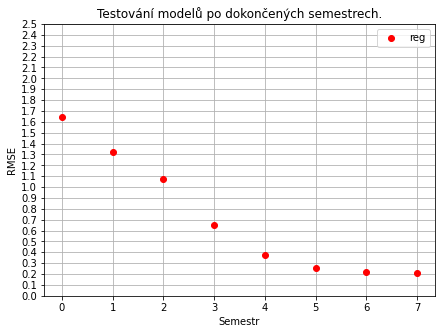

In [68]:
plt.figure(figsize=(7,5))
plt.grid(True)

xreg = results_reg['reg'].index
yreg = results_reg['reg'].values

y_values = np.arange(0.0, 2.55, 0.1)

plt.plot(xreg, yreg, 'o', color='r', label='reg')

plt.title('Testování modelů po dokončených semestrech.')

plt.yticks(y_values)
plt.xlabel('Semestr')
plt.ylabel('RMSE')

plt.legend()

plt.show()

In [69]:
results_reg

,reg
0,1.643
1,1.319
2,1.078
3,0.654
4,0.372
5,0.255
6,0.216
7,0.207


#### Doplněno průměrem

In [70]:
x_test_mean = {0:Xtest_0_mean, 1:Xtest_1_mean, 2:Xtest_2_mean, 3:Xtest_3_mean, 4:Xtest_4_mean, 5:Xtest_5_mean, 6:Xtest_6_mean, 7:Xtest}
for i in range(0, 8):
    results_reg_mean.loc[i, 'reg'] = round(np.sqrt(mean_squared_error(reg.predict(x_test_mean[i]), np.array(ytest))), 3)

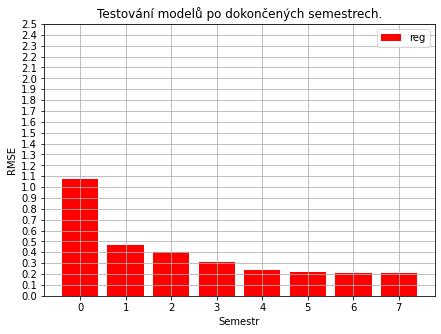

In [71]:
plt.figure(figsize=(7,5))
plt.grid(True)

xreg = results_reg_mean['reg'].index
yreg = results_reg_mean['reg'].values

y_values = np.arange(0.0, 2.55, 0.1)

plt.bar(xreg, yreg, color='r', label='reg')

plt.title('Testování modelů po dokončených semestrech.')

plt.yticks(y_values)
plt.xlabel('Semestr')
plt.ylabel('RMSE')

plt.legend()

plt.show()

In [72]:
results_reg_mean

,reg
0,1.078
1,0.466
2,0.401
3,0.313
4,0.241
5,0.22
6,0.214
7,0.207


## Ostatní modely
### Měřeno accuracy_score

In [73]:
x_test = {0:Xtest_0, 1:Xtest_1, 2:Xtest_2, 3:Xtest_3, 4:Xtest_4, 5:Xtest_5, 6:Xtest_6, 7:Xtest}
for i in range(0, 8):
    results.loc[i, 'dt'] = round(metrics.accuracy_score(ytest, dt_f1.predict(x_test[i])), 3)
    results.loc[i, 'rf'] = round(metrics.accuracy_score(ytest, rf_f1.predict(x_test[i])), 3)
    results.loc[i, 'svm'] = round(metrics.accuracy_score(ytest, svc_f1.predict(x_test[i])), 3)
    results.loc[i, 'ab'] = round(metrics.accuracy_score(ytest, ab_f1.predict(x_test[i])), 3)
    results.loc[i, 'xgb'] = round(metrics.accuracy_score(ytest, xgb_f1.predict(x_test[i])), 3)
    results.loc[i, 'mlp'] = round(metrics.accuracy_score(ytest, mlp.predict(x_test[i])), 3)
    results.loc[i, 'knn'] = round(metrics.accuracy_score(ytest, knn.predict(x_test[i])), 3)

In [74]:
x_test_mean = {0:Xtest_0_mean, 1:Xtest_1_mean, 2:Xtest_2_mean, 3:Xtest_3_mean, 4:Xtest_4_mean, 5:Xtest_5_mean, 6:Xtest_6_mean, 7:Xtest}
for i in range(0, 8):
    results_mean.loc[i, 'dt'] = round(metrics.accuracy_score(ytest, dt_f1.predict(x_test_mean[i])), 3)
    results_mean.loc[i, 'rf'] = round(metrics.accuracy_score(ytest, rf_f1.predict(x_test_mean[i])), 3)
    results_mean.loc[i, 'svm'] = round(metrics.accuracy_score(ytest, svc_f1.predict(x_test_mean[i])), 3)
    results_mean.loc[i, 'ab'] = round(metrics.accuracy_score(ytest, ab_f1.predict(x_test_mean[i])), 3)
    results_mean.loc[i, 'xgb'] = round(metrics.accuracy_score(ytest, xgb_f1.predict(x_test_mean[i])), 3)
    results_mean.loc[i, 'mlp'] = round(metrics.accuracy_score(ytest, mlp.predict(x_test_mean[i])), 3)
    results_mean.loc[i, 'knn'] = round(metrics.accuracy_score(ytest, knn.predict(x_test_mean[i])), 3)

#### Po doplnění 0

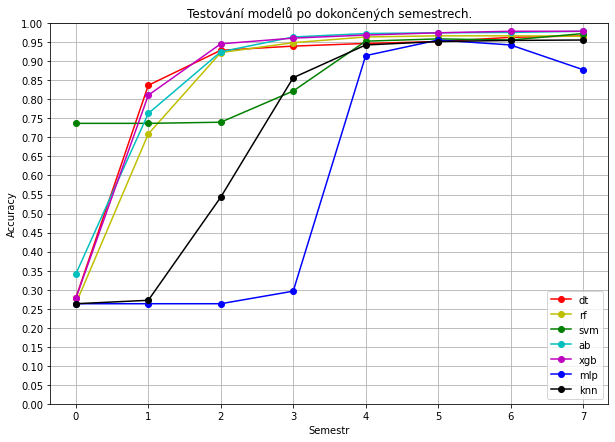

In [75]:
plt.figure(figsize=(10,7))
plt.grid(True)

xdt = results['dt'].index
ydt = results['dt'].values

xrf = results['rf'].index
yrf = results['rf'].values

xsvm = results['svm'].index
ysvm = results['svm'].values

xab = results['ab'].index
yab = results['ab'].values

xxgb = results['xgb'].index
yxgb = results['xgb'].values

xmlp = results['mlp'].index
ymlp = results['mlp'].values

xknn = results['knn'].index
yknn = results['knn'].values

y_values = np.arange(0.0, 1.05, 0.05)

plt.plot(xdt, ydt, '-o', color='r', label='dt')
plt.plot(xrf, yrf, '-o', color='y', label='rf')
plt.plot(xsvm, ysvm, '-o', color='g', label='svm')
plt.plot(xab, yab, '-o', color='c', label='ab')
plt.plot(xxgb, yxgb, '-o', color='m', label='xgb')
plt.plot(xmlp, ymlp, '-o', color='b', label='mlp')
plt.plot(xknn, yknn, '-o', color='k', label='knn')


plt.title('Testování modelů po dokončených semestrech.')

plt.yticks(y_values)
plt.xlabel('Semestr')
plt.ylabel('Accuracy')

plt.legend()

plt.ylim(ymin=0)
plt.ylim(ymax=1)

plt.show()

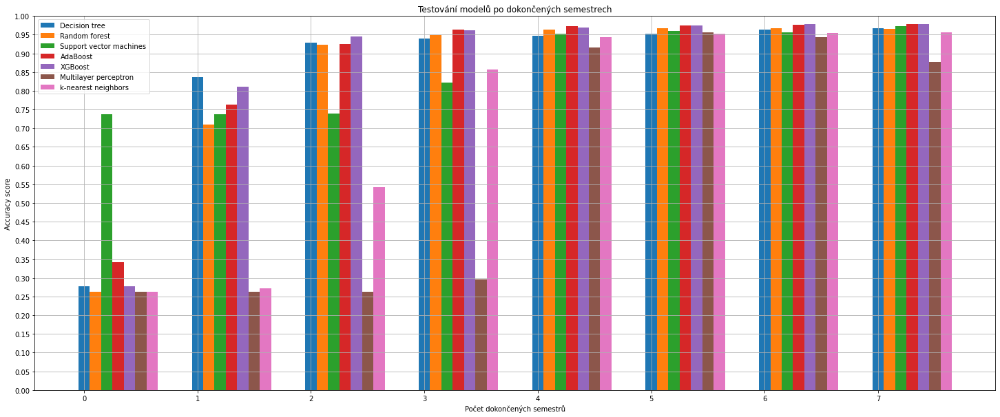

In [76]:
labels = np.array(results.index)

ydt = results['dt'].values

yrf = results['rf'].values

ysvm = results['svm'].values

yab = results['ab'].values

yxgb = results['xgb'].values

ymlp = results['mlp'].values

yknn = results['knn'].values

x = np.arange(len(labels))*2  # the label locations
width = 0.2  # the width of the bars


fig, ax = plt.subplots()
rects_dt = ax.bar(x , ydt, width, label='Decision tree')
rects_rf = ax.bar(x + width, yrf, width, label='Random forest')
rects_svm = ax.bar(x + width * 2, ysvm, width, label='Support vector machines')
rects_ab = ax.bar(x + width * 3, yab, width, label='AdaBoost')
rects_xgb = ax.bar(x + width * 4, yxgb, width, label='XGBoost')
rects_mlp = ax.bar(x + width * 5, ymlp, width, label='Multilayer perceptron')
rects_knn = ax.bar(x + width * 6, yknn, width, label='k-nearest neighbors')

y_values = np.arange(0.0, 1.05, 0.05)

ax.set_ylabel('Accuracy score')
ax.set_xlabel('Počet dokončených semestrů')
ax.set_title('Testování modelů po dokončených semestrech')
ax.set_xticks(x)
ax.set_xticklabels(labels)
plt.yticks(y_values)
ax.legend(loc='best')
ax.grid(True)

plt.ylim(ymin=0)
plt.ylim(ymax=1)

fig.set_size_inches(25,10)
plt.show()

In [77]:
results

,dt,rf,svm,ab,xgb,mlp,knn
0,0.278,0.263,0.737,0.341,0.277,0.263,0.263
1,0.837,0.709,0.737,0.763,0.811,0.263,0.272
2,0.929,0.923,0.74,0.925,0.946,0.263,0.543
3,0.94,0.949,0.822,0.964,0.961,0.296,0.857
4,0.947,0.964,0.953,0.973,0.969,0.915,0.943
5,0.952,0.967,0.959,0.975,0.975,0.956,0.952
6,0.963,0.967,0.956,0.976,0.979,0.943,0.955
7,0.967,0.966,0.973,0.979,0.979,0.878,0.956


#### Po doplněni průměrem

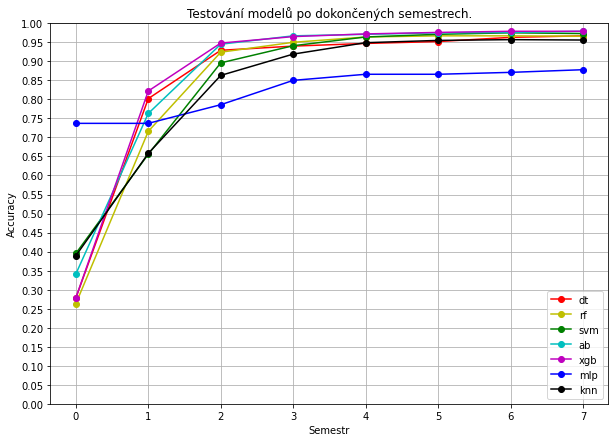

In [78]:
plt.figure(figsize=(10,7))
plt.grid(True)

xdt = results_mean['dt'].index
ydt = results_mean['dt'].values

xrf = results_mean['rf'].index
yrf = results_mean['rf'].values

xsvm = results_mean['svm'].index
ysvm = results_mean['svm'].values

xab = results_mean['ab'].index
yab = results_mean['ab'].values

xxgb = results_mean['xgb'].index
yxgb = results_mean['xgb'].values

xmlp = results_mean['mlp'].index
ymlp = results_mean['mlp'].values

xknn = results_mean['knn'].index
yknn = results_mean['knn'].values

y_values = np.arange(0.0, 1.05, 0.05)

plt.plot(xdt, ydt, '-o', color='r', label='dt')
plt.plot(xrf, yrf, '-o', color='y', label='rf')
plt.plot(xsvm, ysvm, '-o', color='g', label='svm')
plt.plot(xab, yab, '-o', color='c', label='ab')
plt.plot(xxgb, yxgb, '-o', color='m', label='xgb')
plt.plot(xmlp, ymlp, '-o', color='b', label='mlp')
plt.plot(xknn, yknn, '-o', color='k', label='knn')

plt.title('Testování modelů po dokončených semestrech.')

plt.yticks(y_values)
plt.xlabel('Semestr')
plt.ylabel('Accuracy')

plt.legend()

plt.ylim(ymin=0)
plt.ylim(ymax=1)

plt.show()

In [79]:
results_mean

,dt,rf,svm,ab,xgb,mlp,knn
0,0.278,0.263,0.395,0.341,0.278,0.737,0.389
1,0.802,0.716,0.656,0.763,0.822,0.737,0.658
2,0.929,0.924,0.896,0.945,0.948,0.786,0.863
3,0.94,0.95,0.941,0.967,0.965,0.85,0.919
4,0.947,0.964,0.964,0.971,0.972,0.866,0.949
5,0.952,0.967,0.971,0.975,0.976,0.866,0.955
6,0.963,0.967,0.975,0.976,0.979,0.871,0.957
7,0.967,0.966,0.973,0.979,0.979,0.878,0.956


### Měřeno f1_score

In [80]:
x_test = {0:Xtest_0, 1:Xtest_1, 2:Xtest_2, 3:Xtest_3, 4:Xtest_4, 5:Xtest_5, 6:Xtest_6, 7:Xtest}
for i in range(0, 8):
    results_f1.loc[i, 'dt'] = round(metrics.f1_score(ytest, dt_f1.predict(x_test[i])), 3)
    results_f1.loc[i, 'rf'] = round(metrics.f1_score(ytest, rf_f1.predict(x_test[i])), 3)
    results_f1.loc[i, 'svm'] = round(metrics.f1_score(ytest, svc_f1.predict(x_test[i])), 3)
    results_f1.loc[i, 'ab'] = round(metrics.f1_score(ytest, ab_f1.predict(x_test[i])), 3)
    results_f1.loc[i, 'xgb'] = round(metrics.f1_score(ytest, xgb_f1.predict(x_test[i])), 3)
    results_f1.loc[i, 'mlp'] = round(metrics.f1_score(ytest, mlp.predict(x_test[i])), 3)
    results_f1.loc[i, 'knn'] = round(metrics.f1_score(ytest, knn.predict(x_test[i])), 3)

In [81]:
x_test_mean = {0:Xtest_0_mean, 1:Xtest_1_mean, 2:Xtest_2_mean, 3:Xtest_3_mean, 4:Xtest_4_mean, 5:Xtest_5_mean, 6:Xtest_6_mean, 7:Xtest}
for i in range(0, 8):
    results_mean_f1.loc[i, 'dt'] = round(metrics.f1_score(ytest, dt_f1.predict(x_test_mean[i])), 3)
    results_mean_f1.loc[i, 'rf'] = round(metrics.f1_score(ytest, rf_f1.predict(x_test_mean[i])), 3)
    results_mean_f1.loc[i, 'svm'] = round(metrics.f1_score(ytest, svc_f1.predict(x_test_mean[i])), 3)
    results_mean_f1.loc[i, 'ab'] = round(metrics.f1_score(ytest, ab_f1.predict(x_test_mean[i])), 3)
    results_mean_f1.loc[i, 'xgb'] = round(metrics.f1_score(ytest, xgb_f1.predict(x_test_mean[i])), 3)
    results_mean_f1.loc[i, 'mlp'] = round(metrics.f1_score(ytest, mlp.predict(x_test[i])), 3)
    results_mean_f1.loc[i, 'knn'] = round(metrics.f1_score(ytest, knn.predict(x_test[i])), 3)

#### Po doplnění 0

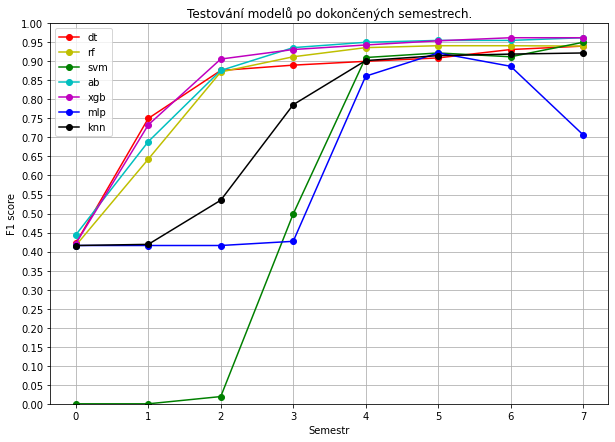

In [82]:
plt.figure(figsize=(10,7))
plt.grid(True)

xdt = results_f1['dt'].index
ydt = results_f1['dt'].values

xrf = results_f1['rf'].index
yrf = results_f1['rf'].values

xsvm = results_f1['svm'].index
ysvm = results_f1['svm'].values

xab = results_f1['ab'].index
yab = results_f1['ab'].values

xxgb = results_f1['xgb'].index
yxgb = results_f1['xgb'].values

xmlp = results_f1['mlp'].index
ymlp = results_f1['mlp'].values

xknn = results_f1['knn'].index
yknn = results_f1['knn'].values

y_values = np.arange(0.0, 1.05, 0.05)

plt.plot(xdt, ydt, '-o', color='r', label='dt')
plt.plot(xrf, yrf, '-o', color='y', label='rf')
plt.plot(xsvm, ysvm, '-o', color='g', label='svm')
plt.plot(xab, yab, '-o', color='c', label='ab')
plt.plot(xxgb, yxgb, '-o', color='m', label='xgb')
plt.plot(xmlp, ymlp, '-o', color='b', label='mlp')
plt.plot(xknn, yknn, '-o', color='k', label='knn')


plt.title('Testování modelů po dokončených semestrech.')

plt.yticks(y_values)
plt.xlabel('Semestr')
plt.ylabel('F1 score')

plt.legend()

plt.ylim(ymin=0)
plt.ylim(ymax=1)

plt.show()

In [83]:
results_f1

,dt,rf,svm,ab,xgb,mlp,knn
0,0.422,0.416,0,0.444,0.421,0.416,0.416
1,0.75,0.643,0,0.689,0.733,0.416,0.419
2,0.876,0.872,0.019,0.876,0.906,0.416,0.535
3,0.89,0.912,0.499,0.936,0.931,0.427,0.786
4,0.9,0.936,0.91,0.95,0.943,0.861,0.902
5,0.909,0.941,0.922,0.955,0.954,0.922,0.915
6,0.931,0.941,0.912,0.955,0.962,0.887,0.919
7,0.94,0.94,0.95,0.962,0.962,0.707,0.922


#### Po doplněni průměrem

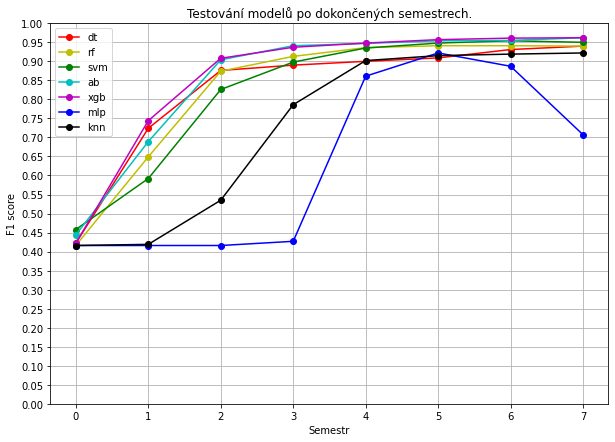

In [84]:
plt.figure(figsize=(10,7))
plt.grid(True)

xdt = results_mean_f1['dt'].index
ydt = results_mean_f1['dt'].values

xrf = results_mean_f1['rf'].index
yrf = results_mean_f1['rf'].values

xsvm = results_mean_f1['svm'].index
ysvm = results_mean_f1['svm'].values

xab = results_mean_f1['ab'].index
yab = results_mean_f1['ab'].values

xxgb = results_mean_f1['xgb'].index
yxgb = results_mean_f1['xgb'].values

xmlp = results_mean_f1['mlp'].index
ymlp = results_mean_f1['mlp'].values

xknn = results_mean_f1['knn'].index
yknn = results_mean_f1['knn'].values

y_values = np.arange(0.0, 1.05, 0.05)

plt.plot(xdt, ydt, '-o', color='r', label='dt')
plt.plot(xrf, yrf, '-o', color='y', label='rf')
plt.plot(xsvm, ysvm, '-o', color='g', label='svm')
plt.plot(xab, yab, '-o', color='c', label='ab')
plt.plot(xxgb, yxgb, '-o', color='m', label='xgb')
plt.plot(xmlp, ymlp, '-o', color='b', label='mlp')
plt.plot(xknn, yknn, '-o', color='k', label='knn')


plt.title('Testování modelů po dokončených semestrech.')

plt.yticks(y_values)
plt.xlabel('Semestr')
plt.ylabel('F1 score')

plt.legend()

plt.ylim(ymin=0)
plt.ylim(ymax=1)

plt.show()

In [86]:
results_mean_f1

,dt,rf,svm,ab,xgb,mlp,knn
0,0.422,0.416,0.458,0.444,0.422,0.416,0.416
1,0.724,0.649,0.592,0.689,0.744,0.416,0.419
2,0.876,0.874,0.826,0.904,0.908,0.416,0.535
3,0.89,0.913,0.898,0.941,0.937,0.427,0.786
4,0.9,0.936,0.935,0.947,0.948,0.861,0.902
5,0.909,0.941,0.948,0.954,0.957,0.922,0.915
6,0.931,0.941,0.954,0.955,0.961,0.887,0.919
7,0.94,0.94,0.95,0.962,0.962,0.707,0.922
